# 1. Notebook setup

In [ ]:
# Link colab to the directories of a given google drive account
import os
from google.colab import drive
ROOT_PATH = os.path.join(os.sep, 'content' , 'gdrive')
drive.mount(ROOT_PATH)

Mounted at /content/gdrive


In [ ]:
!pip install pynrrd
!pip install keras-cv --upgrade

In [ ]:
# Possible useful dependencies
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras import Model
import tensorflow.keras.layers as tfkl
import keras
from datetime import datetime
from dateutil.tz import gettz
import scipy
import cv2
from PIL import Image
import nrrd

In [ ]:
# Set the seed for repeatability
seed = 42
tf.random.set_seed(seed)
np.random.seed(seed)

In [ ]:
# Path setup
WD_PATH = os.path.join(ROOT_PATH, 'MyDrive', '''your_path''') # substitute this with your folder
if not os.path.exists(WD_PATH):
    os.mkdir(WD_PATH)

# 2. Splitting of the dataset divided by patient

The dataset consists of images from 4 patients, with Gaussian noise added to all images to simulate variability.

To prevent cross-contamination between the training, validation, and test sets, we avoided random splitting of the data. Random splitting could place consecutive video frames—highly similar to each other—into both the training and test sets, allowing the model to encounter frames in the training set that closely resemble those in the test set, thus compromising evaluation validity.

Additionally, the images were originally in RGB format. We converted them to grayscale and normalized the pixel values to the [0, 1] range for consistent preprocessing.

In [ ]:
# Image folder
image_folder = os.path.join(WD_PATH, 'Dataset/Uncached Dataset/GS_images')

# Label folder created by us because the names of the provided ones were not consistent
seg_folder = os.path.join(WD_PATH, 'Segmentation')

# Function to retrieve files containing a specific pattern in their names
def get_files_by_name(source_folder, label_folder, pattern, len):
    image_arrays = np.zeros((len, 256, 256, 1))  # Array to store the image paths
    label_arrays = np.zeros((len, 256, 256, 1))  # Array to store the label paths
    index = 0
    for filename in os.listdir(source_folder):
        if pattern in filename:  # If the pattern is present in the file name
            labelname = filename.replace('tiff', 'nrrd')
            image_path = os.path.join(source_folder, filename)
            label_path = os.path.join(label_folder, labelname)

            image = Image.open(image_path)  # Load the image
            image = image.convert('L')    # Convert to grayscale
            image_array = np.array(image)  # Convert the image to a numpy array
            image_array = image_array / 255.0  # Normalize the image to values between 0 and 1
            image_arrays[index, :, :, 0] = image_array

            label, header = nrrd.read(label_path)  # Load the nrrd file
            label = np.transpose(label, axes=(1, 0, 2))  # Transpose the array
            label_arrays[index, :, :, :] = label

            index += 1
    return image_arrays, label_arrays

NameError: name 'WD_PATH' is not defined

In [ ]:
# Apply the function to all the patient's images
s1_micro_images, s1_micro_labels = get_files_by_name(image_folder, seg_folder, "s00001_tMICROSCOPIC", 100)
s1_segre_images, s1_segre_labels = get_files_by_name(image_folder, seg_folder, "s00001_tSEGRE", 100)
s1_top_images, s1_top_labels = get_files_by_name(image_folder, seg_folder,  "s00001_tTOPCOP", 80)
s2_micro_images, s2_micro_labels = get_files_by_name(image_folder, seg_folder,  "s00002_tMICROSCOPIC", 80)
s2_segre_images, s2_segre_labels = get_files_by_name(image_folder, seg_folder,  "s00002_tSEGREGATION", 100)
s2_top_images, s2_top_labels = get_files_by_name(image_folder, seg_folder,  "s00002_tTOPCOP", 60)
s4_micro_images, s4_micro_labels = get_files_by_name(image_folder, seg_folder,  "s00004_tMICROSCOPIC", 50)
s4_pata_images, s4_pata_labels = get_files_by_name(image_folder, seg_folder,  "s00004_tPATAKA", 50)
s4_wel_images, s4_wel_labels = get_files_by_name(image_folder, seg_folder,  "s00004_tWELCOME", 50)
s5_count_images, s5_count_labels = get_files_by_name(image_folder, seg_folder,  "s00005_tCOUNT", 50)
s5_ka_images, s5_ka_labels = get_files_by_name(image_folder, seg_folder,  "s00005_tKA", 50)
s5_pa_images, s5_pa_labels = get_files_by_name(image_folder, seg_folder,  "s00005_tPA", 50)

In [ ]:
# New data path
new_data_path = os.path.join(WD_PATH, 'Dataset_new')
if not os.path.exists(new_data_path):
    os.mkdir(new_data_path)

# Save the arrays in npz files
np.savez(os.path.join(new_data_path, 's1_micro_images.npz'), images=s1_micro_images)
np.savez(os.path.join(new_data_path, 's1_micro_labels.npz'), labels=s1_micro_labels)

np.savez(os.path.join(new_data_path, 's1_segre_images.npz'), images=s1_segre_images)
np.savez(os.path.join(new_data_path, 's1_segre_labels.npz'), labels=s1_segre_labels)

np.savez(os.path.join(new_data_path, 's1_top_images.npz'), images=s1_top_images)
np.savez(os.path.join(new_data_path, 's1_top_labels.npz'), labels=s1_top_labels)

np.savez(os.path.join(new_data_path, 's2_micro_images.npz'), images=s2_micro_images)
np.savez(os.path.join(new_data_path, 's2_micro_labels.npz'), labels=s2_micro_labels)

np.savez(os.path.join(new_data_path, 's2_segre_images.npz'), images=s2_segre_images)
np.savez(os.path.join(new_data_path, 's2_segre_labels.npz'), labels=s2_segre_labels)

np.savez(os.path.join(new_data_path, 's2_top_images.npz'), images=s2_top_images)
np.savez(os.path.join(new_data_path, 's2_top_labels.npz'), labels=s2_top_labels)

np.savez(os.path.join(new_data_path, 's4_micro_images.npz'), images=s4_micro_images)
np.savez(os.path.join(new_data_path, 's4_micro_labels.npz'), labels=s4_micro_labels)

np.savez(os.path.join(new_data_path, 's4_pata_images.npz'), images=s4_pata_images)
np.savez(os.path.join(new_data_path, 's4_pata_labels.npz'), labels=s4_pata_labels)

np.savez(os.path.join(new_data_path, 's4_wel_images.npz'), images=s4_wel_images)
np.savez(os.path.join(new_data_path, 's4_wel_labels.npz'), labels=s4_wel_labels)

np.savez(os.path.join(new_data_path, 's5_count_images.npz'), images=s5_count_images)
np.savez(os.path.join(new_data_path, 's5_count_labels.npz'), labels=s5_count_labels)

np.savez(os.path.join(new_data_path, 's5_ka_images.npz'), images=s5_ka_images)
np.savez(os.path.join(new_data_path, 's5_ka_labels.npz'), labels=s5_ka_labels)

np.savez(os.path.join(new_data_path, 's5_pa_images.npz'), images=s5_pa_images)
np.savez(os.path.join(new_data_path, 's5_pa_labels.npz'), labels=s5_pa_labels)


## 2.1 Data Load

Splitting has been done like this:

- 50 images of patient 5 in test (6,1 %)
- 100 images of patient 5 in validation (12,2 %)
- The other images (patient 1 to 4) in training (81,7 %)


In [ ]:
# Creation of training, validation and test sets
x_train = np.concatenate((s1_micro_images,
                          s1_segre_images,
                          s1_top_images,
                          s2_micro_images,
                          s2_segre_images,
                          s2_top_images,
                          s4_micro_images,
                          s4_pata_images,
                          s4_wel_images))

y_train = np.concatenate((s1_micro_labels,
                          s1_segre_labels,
                          s1_top_labels,
                          s2_micro_labels,
                          s2_segre_labels,
                          s2_top_labels,
                          s4_micro_labels,
                          s4_pata_labels,
                          s4_wel_labels))

x_val = np.concatenate((s5_count_images,
                        s5_ka_images))

y_val = np.concatenate((s5_count_labels,
                        s5_ka_labels))

x_test = s5_pa_images
y_test = s5_pa_labels

print('x_train shape', x_train.shape)
print('y_train shape', y_train.shape)
print('x_val shape', x_val.shape)
print('y_val shape', y_val.shape)
print('x_test shape', x_test.shape)
print('y_test shape', y_test.shape)


x_train shape (670, 256, 256, 1)
y_train shape (670, 256, 256, 1)
x_val shape (100, 256, 256, 1)
y_val shape (100, 256, 256, 1)
x_test shape (50, 256, 256, 1)
y_test shape (50, 256, 256, 1)


In [ ]:
y_train = tf.keras.utils.to_categorical(y_train, num_classes=NUM_CLASSES)
y_val = tf.keras.utils.to_categorical(y_val, num_classes=NUM_CLASSES)
y_test = tf.keras.utils.to_categorical(y_test, num_classes=NUM_CLASSES)

In [ ]:
print('y_train shape', y_train.shape)
print('y_val shape', y_val.shape)
print('y_test shape', y_test.shape)

y_train shape (670, 256, 256, 7)
y_val shape (100, 256, 256, 7)
y_test shape (50, 256, 256, 7)


In [ ]:
num_classes = y_train.shape(-1)
input_shape = x_train.shape[1:]

# 3. Label count
We calculated the mean number of pixels for each class to determine the appropriate loss weights. These weights are applied to the loss function to address the class imbalance issue, ensuring the network gives proper attention to underrepresented classes during training.

In [ ]:
# Counting the mean number of pixel for each class in each image
label_count = np.zeros([7, 1])

for i in range(np.size(y_train, 3)):
  for j in range(np.size(y_train, 0)):
    label_count[i] = label_count[i] + np.sum(y_train[j, :, :, i])

label_count = label_count/np.size(y_train, 0)
label_count

In [ ]:
label_mean_values = {"BKG": 51575.88414634,
           "UL": 103.51676829,
           "HP": 150.63567073,
           "SP": 101.21493902,
           "TO": 1141.98018293,
           "LL": 548.25304878,
           "HE": 11914.5152439
           }
print(label_mean_values)

{'BKG': 51575.88414634, 'UL': 103.51676829, 'HP': 150.63567073, 'SP': 101.21493902, 'TO': 1141.98018293, 'LL': 548.25304878, 'HE': 11914.5152439}


In [ ]:
# Compute the weights for the weighted loss
import numpy as np

# Calculate the inverse frequency
class_weights = 1.0 / label_count.flatten()

# Normalize the weights around mean value of 1 for the loss function to be scaled properly during training
normalized_weights = class_weights * NUM_CLASSES / np.sum(class_weights)

print("Class weights:", class_weights)
print("Normalized class weights:", normalized_weights)

Class weights: [1.93889066e-05 9.66027066e-03 6.63853386e-03 9.87996446e-03
 8.75671938e-04 1.82397527e-03 8.39312368e-05]
Normalized class weights: [0.00468303 2.33325892 1.60341453 2.38632187 0.21150229 0.44054734
 0.02027203]


# 4. Dataset formatting in tensorflow data format
We found that the best trade-off between computation speed and GPU resources available (16GB) was a batch size of 8.

In [ ]:
BATCH_SIZE = 8

# Create dataset where each item is a tuple (image, image_segmented)
train_ds = tf.data.Dataset.from_tensor_slices((x_train, y_train)).map(
    lambda x, y: (tf.cast(x, tf.float32), tf.cast(y, tf.float32))
)

val_ds = tf.data.Dataset.from_tensor_slices((x_val, y_val)).map(
    lambda x, y: (tf.cast(x, tf.float32), tf.cast(y, tf.float32))
)

test_ds = tf.data.Dataset.from_tensor_slices((x_test, y_test)).map(
    lambda x, y: (tf.cast(x, tf.float32), tf.cast(y, tf.float32))
)

# shuffle and batch train_ds
train_ds = train_ds.shuffle(buffer_size=BATCH_SIZE * 16)  # Mix the data
train_ds = train_ds.batch(BATCH_SIZE, drop_remainder=False)  # Create batch
train_ds = train_ds.prefetch(tf.data.AUTOTUNE)  # Improve the computational performance

# Batch val_ds
val_ds = val_ds.batch(BATCH_SIZE, drop_remainder=False)
val_ds = val_ds.prefetch(tf.data.AUTOTUNE)

# Take 1 batch as example
for batch in train_ds.take(1):
    print(batch[0].shape)  # (BATCH_SIZE, H, W, C)
    print(batch[1].shape)  # (BATCH_SIZE, H, W, NUM_CLASSES)

(8, 256, 256, 1)
(8, 256, 256, 7)


# 5. Functions for data augmentation

Given the relatively small size of our dataset compared to the complexity of the network, we applied data augmentation to enhance the variability of the input images. This approach aims to improve the network's generalization capabilities by exposing it to a broader range of scenarios during training.

We choose horizontal random flip, contrast and brightness variations since they seem more coherent with the medical images context.

In [ ]:
@tf.function
def random_flip(image, label, seed=seed):
    """Consistent random horizontal flip for both image and label."""

    # Determine the probability of flipping
    flip_prob = tf.random.uniform([], seed=seed)

    # Flip the image
    image = tf.cond(
        flip_prob > 0.5,
        lambda: tf.image.flip_left_right(image),
        lambda: image
    )

    # Flip the segmentation (label)
    label = tf.cond(
        flip_prob > 0.5,
        lambda: tf.image.flip_left_right(label),
        lambda: label
    )

    return image, label

In [ ]:
@tf.function
def random_brightness(image, label, max_delta=0.2, seed=seed):
    """Increase or decrease brightness by a random factor."""

    # Determine the probability of modifying brightness
    brightness_prob = tf.random.uniform([], minval=0., maxval=1., seed=seed)

    # Modify brightness
    image = tf.cond(
        brightness_prob > 0.5,
        lambda: tf.image.random_brightness(image, max_delta=max_delta, seed=seed),
        lambda: image
    )

    return image, label


In [ ]:
@tf.function
def random_contrast(image, label, lower=0.5, upper=1.5, seed=seed):
    """Applies a random contrast adjustment to the image."""

    # Determine the probability of contrast adjustment
    contrast_prob = tf.random.uniform([], minval=0., maxval=1., seed=seed)

    # Modify the contrast
    image = tf.cond(
        contrast_prob > 0.5,
        lambda: tf.image.random_contrast(image, lower=lower, upper=upper, seed=seed),
        lambda: image
    )

    return image, label

In [ ]:
@tf.function
def augment_image(image, label, seed=seed):
    """Applies various augmentations with specified probabilities."""

    # Horizontal flip
    image, label = random_flip(image, label, seed=seed)

    # Brightness adjustment
    image, label = random_brightness(image, label, seed=seed)

    # Contrast distortion
    image, label = random_contrast(image, label, seed=seed)

    return image, label


In [ ]:
# Apply the augmentations
train_ds = train_ds.map(
    lambda x, y: augment_image(x, y, seed=seed),
    num_parallel_calls=tf.data.AUTOTUNE
)

# 6. Other functions (losses, metrics)

## 6.1 Losses
These are the functions that are to be minimized in the training process.The one we ended up using is a combined loss 0.6 weighted cross-entropy and 0.4 dice loss

In [ ]:
def weighted_cross_entropy(num_classes, class_weights):
    """
    Weighted categorical cross-entropy loss with class weights for 2D/3D inputs.

    Args:
    - num_classes (int): Number of classes.
    - class_weights (list or array): Weights for each class. Length must match `num_classes`.

    Returns:
    - A callable loss function.
    """
    def loss(y_true, y_pred):
        # Ensure y_true and y_pred are float32
        y_true = tf.cast(y_true, dtype=tf.float32)
        y_pred = tf.cast(y_pred, dtype=tf.float32)

        # Prevent log(0) with epsilon
        y_pred = K.clip(y_pred, K.epsilon(), 1 - K.epsilon())

        # Compute the cross-entropy weighted for each class
        weighted_loss = 0.0
        for c in range(num_classes):
            weight = class_weights[c]
            class_loss = -y_true[..., c] * tf.math.log(y_pred[..., c])
            weighted_loss += weight * class_loss

        # Average over all spatial dimensions and the batch
        loss_ce = tf.reduce_mean(weighted_loss)
        return loss_ce

    return loss


In [ ]:
import tensorflow.keras.backend as K

def dice_loss(y_true, y_pred, smooth=K.epsilon()):
    """
    Calculates the Dice Loss, which measures the similarity between segmented images and ground truth.

    Args:
    - y_true: Ground truth labels in one-hot encoded or binary format.
    - y_pred: Model predictions in one-hot encoded or probability format.
    - smooth: A small value to avoid division by zero.

    Returns:
    - The Dice Loss.
    """
    # Ensure predictions are treated as probabilities
    # y_pred = K.clip(y_pred, 0, 1)

    # Compute the Dice Similarity Coefficient (DSC)
    intersection = K.sum(y_true * y_pred, axis=(1, 2, 3))  # Sum over all classes for each image
    union = K.sum(y_true, axis=(1, 2, 3)) + K.sum(y_pred, axis=(1, 2, 3))  # Sum of ground truth and predicted areas
    dice = (2.0 * intersection + smooth) / (union + smooth)  # Dice Similarity formula

    return 1 - dice  # Dice Loss is 1 minus DSC (to minimize the loss)

In [ ]:
def combined_loss(num_classes, class_weights, alpha=0.5, beta=0.5, smooth=K.epsilon()):
    """
    Combines the Weighted Cross-Entropy Loss and Dice Loss into a composite loss function.

    Args:
    - num_classes (int): Number of classes.
    - class_weights (list or array): Weights for each class for cross-entropy.
    - alpha (float): Weighting factor for the Weighted Cross-Entropy Loss.
    - beta (float): Weighting factor for the Dice Loss.
    - smooth (float): Small value to avoid division by zero in Dice Loss.

    Returns:
    - A combined loss function.
    """
    # Retrieve individual loss functions
    wce_loss = weighted_cross_entropy(num_classes, class_weights)

    def loss(y_true, y_pred):
        # Calculate individual losses
        loss_wce = wce_loss(y_true, y_pred)
        loss_dice = dice_loss(y_true, y_pred, smooth=smooth)

        # Combine the losses with the weights
        combined = alpha * loss_wce + beta * loss_dice
        return combined

    return loss

## 6.2 Metrics

This is the primary metric used during the training phase to evaluate and select the best model.

Mean Dice: $\, DICE = \frac{1}{C}  \sum_{c = 1}^{C} \frac{2 \lvert S_g^c \cap S_p^c \rvert}{\lvert S_g^c \rvert + \lvert S_p^c \rvert} = \frac{2\,\sum_{c=1}^{C}\sum_{i=1}^{N}g_i^c\,p_i^c}{\sum_{c=1}^{C}\sum_{i=1}^{N}g_i^c \,+\, \sum_{c=1}^{C}\sum_{i=1}^{N}p_i^c  } \quad$ [[3]](https://bmcmedimaging.biomedcentral.com/track/pdf/10.1186/s12880-015-0068-x.pdf)

In [ ]:
class Mean_DICE(keras.metrics.Metric):
    def __init__(self, num_classes, name='Mean_DICE', smooth_factor=1e-9, **kwargs):
        super().__init__(name=name, **kwargs)
        self.num_classes = num_classes
        self.smooth_factor = smooth_factor

        # Accumulative variables
        self.total_dice = self.add_weight(name="total_dice", initializer="zeros", dtype=tf.float32)
        self.num_samples = self.add_weight(name="num_samples", initializer="zeros", dtype=tf.float32)

    def update_state(self, y_true, y_pred, sample_weight=None):
        y_true = tf.cast(y_true, dtype=tf.float32)
        y_pred = tf.cast(y_pred, dtype=tf.float32)

        if len(y_pred.shape) == 4:
            axis = (1, 2)
        elif len(y_pred.shape) == 5:
            axis = (1, 2, 3)
        else:
            raise ValueError("y_pred must have 4 or 5 dimensions.")

        dice_classes = 0.0

        for c in range(self.num_classes):
            abs_label = tf.reduce_sum(y_true[..., c], axis=axis)
            abs_pred = tf.reduce_sum(y_pred[..., c], axis=axis)

            MD_batch_denom = abs_label + abs_pred + self.smooth_factor
            MD_batch_num = 2 * tf.reduce_sum(y_true[..., c] * y_pred[..., c], axis=axis) + self.smooth_factor

            dice_image = MD_batch_num / MD_batch_denom
            dice_classes += dice_image

        mean_dice = dice_classes / self.num_classes
        batch_mean_dice = tf.reduce_mean(mean_dice)

        # Updating
        self.total_dice.assign_add(batch_mean_dice)
        self.num_samples.assign_add(1.0)

    def result(self):
        return self.total_dice / self.num_samples

    def reset_states(self):
        self.total_dice.assign(0.0)
        self.num_samples.assign(0.0)

    def get_config(self):
        config = super().get_config()
        config.update({'num_classes': self.num_classes, 'smooth_factor': self.smooth_factor})
        return config

    @classmethod
    def from_config(cls, config):
        return cls(**config)

# 7. Networks building
We implemented the original network described in the provided paper. We also tried a different architecture in order to increase performances across scales.

ORIGINAL NET: The network is an improved U-Net architecture designed for segmenting MII oocyte images. It incorporates residual blocks for better feature propagation, dilated convolutions for capturing fine details, and a weighted loss function to handle class imbalances. These enhancements significantly boost segmentation accuracy and robustness compared to the traditional U-Net.

OUR IMPROVEMENTS: we modified the decoder by extracting multi-level features, resizing and concatenating them, and feeding them into the final 1x1 convolutional layer. The idea is to use coarse features for larger objects and detailed maps for smaller ones, improving performance across scales with respect to the original architecture.

In [ ]:
def residual_block(x, n_filters):
  '''implementation of the residual block described in
  https://www.sciencedirect.com/science/article/pii/S0169260721000201?via%3Dihub'''
  shortcut = x

  x = tfkl.BatchNormalization()(x)
  x = tfkl.ReLU()(x)
  x = tfkl.Conv2d(n_filters, 3, padding = 'same', activation = None)(x)

  x = tfkl.BatchNormalization()(x)
  x = tfkl.ReLU()(x)
  x = tfkl.Conv2d(n_filters, 3, padding = 'same', activation = None)(x)

  shortcut = tfkl.Conv2d(n_filters, 1, padding = 'same', activation = None)(shortcut)
  shortcut = tfkl.BatchNormalization()(shortcut)

  out = tfkl.Add()([shortcut, x])
  return out

def decoder_block(x, n_filters, skip, dropout = 0.5):
  '''implementation of the decoder block described in
  https://www.sciencedirect.com/science/article/pii/S0169260721000201?via%3Dihub'''
  x = tfkl.Conv2DTranspose(n_filters, 1, strides=(2, 2), padding='same')(x)
  x = tfkl.BatchNormalization()(x)

  x = tfkl.Concatenate()([x, skip])
  x = tfkl.Dropout(dropout)(x)

  out = residual_block(x, n_filters)
  return out

def encoder_block(x, n_filters, dropout = 0.5):
  '''implementation of the encoder block described in
  https://www.sciencedirect.com/science/article/pii/S0169260721000201?via%3Dihub'''
  skip = residual_block(x, n_filters)
  x = tfkl.MaxPool2D(2)(skip)
  x = tfkl.Dropout(dropout)(x)
  return x, skip

def dilated_conv_block(x, filters):
  '''implementation of the bottleneck described in
  https://www.sciencedirect.com/science/article/pii/S0169260721000201?via%3Dihub'''
  for dilation_rate in [1, 2, 4, 8]:
      x = Conv2D(filters, (3, 3), dilation_rate=dilation_rate, padding='same', activation='relu')(x)
  return x

def improved_unet(x, num_classes, n_filters = 16, dropout = 0.5):
  '''implementetion of the improved unet'''
  x = residual_block(x, n_filters)

  # encoder
  x, skip1 = encoder_block(x, 2*n_filters)
  x, skip2 = encoder_block(x, 4*n_filters)
  x, skip3 = encoder_block(x, 8*n_filters)
  x, skip4 = encoder_block(x, 16*n_filters)

  # bottleneck
  x = dilated_conv_block(x, 32*n_filters)

  # decoder
  d1 = decoder_block(x, 16*n_filters, skip4)
  d2 = decoder_block(d1, 8*n_filters, skip3)
  d3 = decoder_block(d2, 4*n_filters, skip2)
  d4 = decoder_block(d3, 2*n_filters, skip1)

  # head
  out = tfkl.Conv2D(num_classes, 1, padding="same", activation = "softmax")(d4)
  return out

def our_improved_unet(x, num_classes, n_filters = 16, dropout = 0.5):
  '''implementetion of our improved unet'''
  x = residual_block(x, n_filters)

  # encoder
  x, skip1 = encoder_block(x, 2*n_filters)
  x, skip2 = encoder_block(x, 4*n_filters)
  x, skip3 = encoder_block(x, 8*n_filters)
  x, skip4 = encoder_block(x, 16*n_filters)

  # bottleneck
  x = dilated_conv_block(x, 32*n_filters)

  # decoder
  d1 = decoder_block(x, 16*n_filters, skip4)
  d2 = decoder_block(d1, 8*n_filters, skip3)
  d3 = decoder_block(d2, 4*n_filters, skip2)
  d4 = decoder_block(d3, 2*n_filters, skip1)

  up_d1 = tf.image.resize(d1, size=(256, 256), method='bilinear')
  up_d2 = tf.image.resize(d2, size=(256, 256), method='bilinear')
  up_d3 = tf.image.resize(d3, size=(256, 256), method='bilinear')

  x = tfkl.Concatenate()([up_d1, up_d2, up_d3, d4])

  # head
  out = tfkl.Conv2D(num_classes, 1, padding="same", activation = "softmax")(x)
  return out

In [ ]:
#Model Building
def build_model(
    input_shape,
    num_classes = 7,
    seed = 42
    n_filters = 16,
    dropout = 0.5,
):
    # Set the random seed for reproducibility
    tf.random.set_seed(seed)

    # Define the input layer
    input = tfkl.Input(shape=input_shape, name='Input')

    # Define the output layer
    output = our_improved_unet(x, num_classes, n_filters= n_filters, dropout= dropout) # change this function to use the other model

    # Define the model
    model = tf.keras.Model(inputs=input, outputs=output, name='Improved_UNET')

    return model

In [ ]:
model = build_model(input_shape = input_shape,
                    num_classes = num_classes,
                    seed = seed,
                    n_filters = 16,
                    dropout = 0.2)

# 8. Model compiling

In this phase we specify the optimizer, that specifies how the minimization process is carried out, the loss and the metrics. The folders for saving the checkpoints and the final model are also created.

In [ ]:
# List of metrics for evaluation
metrics = [Mean_DICE(num_classes=num_classes)]

# Configure the Adam optimizer
adam_optimizer = tf.keras.optimizers.Adam(
    learning_rate=0.0001,  # Step size (α)
    beta_1=0.9,            # Exponential decay rate for the first moment (β1)
    beta_2=0.999,          # Exponential decay rate for the second moment (β2)
    epsilon=1e-8           # Small constant to prevent division by zero (ε)
)

# Model.compile --> define loss, optimizer, and metrics to be used during training
model.compile(loss=combined_loss(num_classes=num_classes, class_weights=normalized_weights, alpha=0.6, beta=0.4),
              optimizer=adam_optimizer,
              metrics=metrics)

# Create a directory tree to neatly save the models
training_path = os.path.join(path_cartella, 'Training_' + datetime.now(gettz("Europe/Rome")).strftime("%Y-%m-%d-T%H:%M"))
checkpoint_path = os.path.join(training_path, 'Checkpoints')
best_model_path = os.path.join(training_path, 'Best_Model')

# Create directories if they don't exist
if not os.path.exists(training_path):
    os.mkdir(training_path)
if not os.path.exists(checkpoint_path):
    os.mkdir(checkpoint_path)
if not os.path.exists(best_model_path):
    os.mkdir(best_model_path)

# 9. Callbacks

These are optional implementations that enhance the quality of the training.

ReduceLROnPlateau: reduces the learning rate by a certain factor every time a metric doesn't improve for a certain number of epochs

EarlyStopping: Stops the training after a certain number of epochs without improvement is reached. The best model weights are then restored.

TensorBoard: very useful tool that monitors training parameters and helps visualizing them at the end.

In [ ]:
# Callback for reducing the learning rate on plateau
ReduceLROnPlateau = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',  # Monitor the validation loss
    factor=0.1,           # Factor by which the learning rate will be reduced
    patience=10,          # Number of epochs with no improvement before reducing LR
    verbose=1,            # Display a message when the learning rate is reduced
    min_lr=1e-10          # Minimum learning rate
)

# Callback to keep track of the model with the best validation Mean_DICE
patience = 20
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',  # Here it monitors the val_loss
    mode='min',          # Minimize the validation loss
    patience=patience,   # Number of epochs with no improvement before stopping training
    restore_best_weights=True  # Restore the weights of the best model
)

# Callback for tensorboard monitoring
tensorboard_callback = tf.keras.callbacks.TensorBoard(
    log_dir=checkpoint_path,  # Log directory for TensorBoard
    histogram_freq=1,          # Log histograms of weights
    write_graph=False,         # Do not save the computation graph
    write_images=False         # Do not save model visualization images
)

# 10. Tensorboard + Model Training & Evaluation

In [ ]:
# Kills eventual tensorboard session that are active
!kill $(sudo lsof -t -i:6006)

kill: usage: kill [-s sigspec | -n signum | -sigspec] pid | jobspec ... or kill -l [sigspec]


In [ ]:
%load_ext tensorboard

Model Fitting: the metrics can be monitored in real time

In [ ]:
# Model.fit --> actual training of the model using back-propagation for updating weights
history = model.fit(train_ds,
                    validation_data=val_ds,
                    epochs=250,
                    callbacks=[early_stopping, ReduceLROnPlateau, tensorboard_callback])

Epoch 1/250
84/84 ━━━━━━━━━━━━━━━━━━━━ 182s 1s/step - Mean_DICE: 0.4603 - loss: 0.0753 - val_Mean_DICE: 0.1242 - val_loss: 0.2438 - learning_rate: 1.0000e-04
Epoch 2/250
84/84 ━━━━━━━━━━━━━━━━━━━━ 84s 482ms/step - Mean_DICE: 0.7469 - loss: 0.0144 - val_Mean_DICE: 0.1278 - val_loss: 0.2218 - learning_rate: 1.0000e-04
Epoch 3/250
84/84 ━━━━━━━━━━━━━━━━━━━━ 39s 462ms/step - Mean_DICE: 0.7783 - loss: 0.0119 - val_Mean_DICE: 0.2111 - val_loss: 0.1480 - learning_rate: 1.0000e-04
Epoch 4/250
84/84 ━━━━━━━━━━━━━━━━━━━━ 39s 462ms/step - Mean_DICE: 0.7935 - loss: 0.0107 - val_Mean_DICE: 0.3633 - val_loss: 0.0765 - learning_rate: 1.0000e-04
Epoch 5/250
84/84 ━━━━━━━━━━━━━━━━━━━━ 39s 464ms/step - Mean_DICE: 0.8005 - loss: 0.0101 - val_Mean_DICE: 0.4786 - val_loss: 0.0508 - learning_rate: 1.0000e-04
Epoch 6/250
84/84 ━━━━━━━━━━━━━━━━━━━━ 40s 472ms/step - Mean_DICE: 0.8039 - loss: 0.0100 - val_Mean_DICE: 0.6336 - val_loss: 0.0284 - learning_rate: 1.0000e-04
Epoch 7/250
84/84 ━━━━━━━━━━━━━━━━━━━━ 40s

In [ ]:
%cd $best_model_path

/content/gdrive/MyDrive/vocal_tract_segmentation/Training_2024-12-12-T11:56/Best_Model


Save the model in the "best model" path

In [ ]:
# Save the model
model.save('model.keras')

In [ ]:
%cd $WD_PATH

/content/gdrive/MyDrive/Colab Notebooks/Neuroengineering PW/Training1_pipeline_training


Visualization of training data thanks to tensorboard

In [ ]:
%tensorboard --logdir "$checkpoint_path"

<IPython.core.display.Javascript object>

# 11. Predictions and evaluation on the test set

## 11.1 Predictions

Using the best model on the test set to evaluate the results on unseen data.

In [ ]:
# Best model load
model_path = os.path.join(best_model_path, 'model.keras')

model = tf.keras.models.load_model(model_path, compile=False)

In [ ]:
# Predictions on the test set
predictions = best_model.predict(x_test)
print('prediction shape: {}'.format(predictions.shape))


2/2 ━━━━━━━━━━━━━━━━━━━━ 36s 14s/step
prediction shape: (50, 256, 256, 7)


## 11.2 Postprocessing (argmax)

Here, the maximum value for each channel is taken, so that each pixel will be assigned to the class with highest probability of being the actual one.

In [ ]:
# Argmax to extract the most probable class for each pixel
predictions_argmax = np.argmax(predictions, axis = -1)

# One hot encoding to compare them with the ground truth
predictions_onehot = tf.keras.utils.to_categorical(predictions_argmax, num_classes=7)

prediction shape: (50, 256, 256, 7)
prediction shape: (50, 256, 256, 7)


## 11.3 Predictions Plotting

Very helpful to ensure visual accuracy of the predictions. Each ground truth label is associated with the predicted mask, enabling a fast and intuitive way to visualize the predictions

Img n°:  0


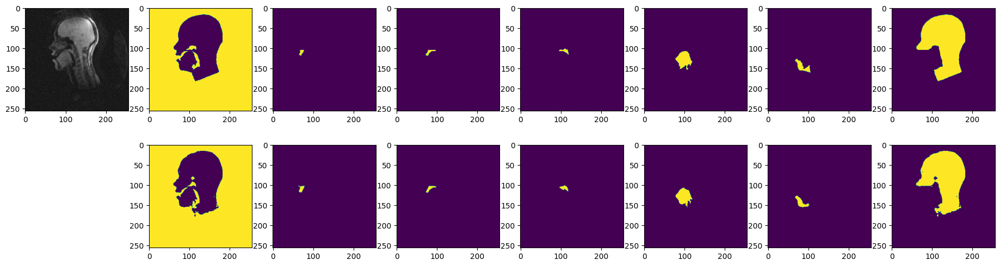

Img n°:  1


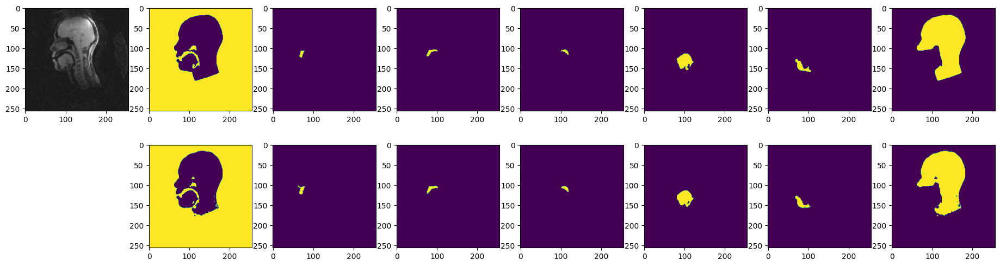

Img n°:  2


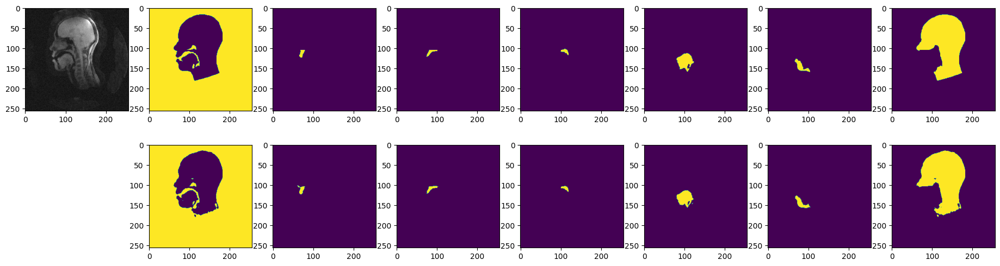

Img n°:  3


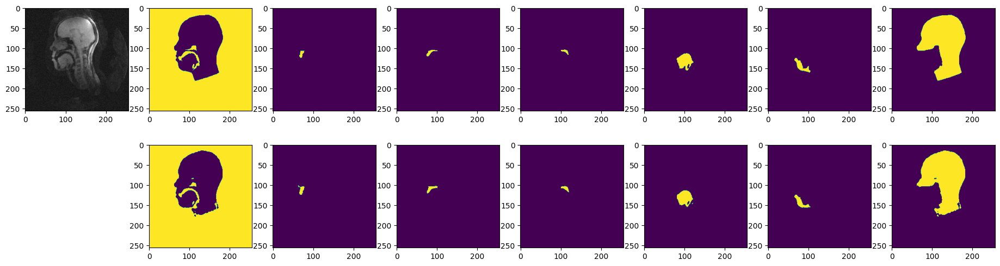

Img n°:  4


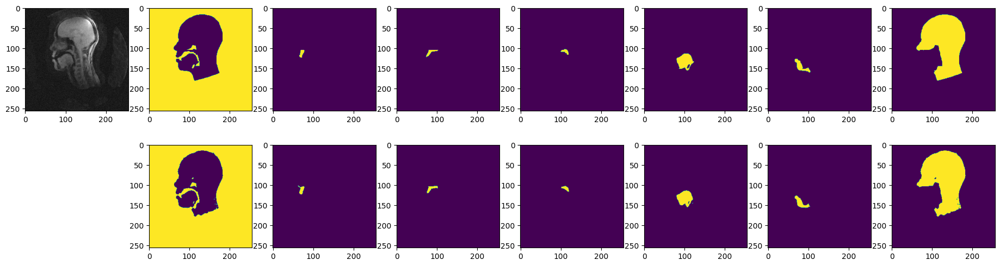

Img n°:  5


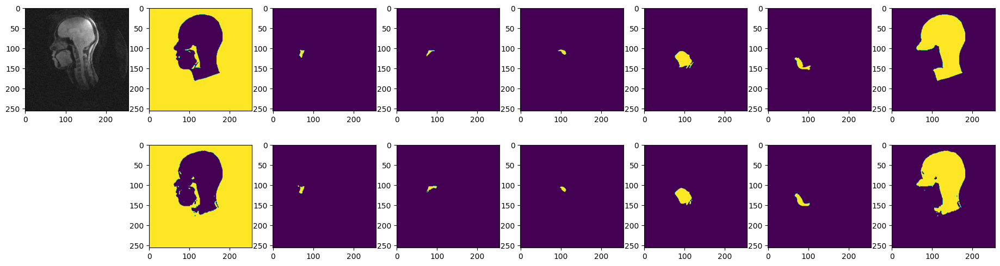

Img n°:  6


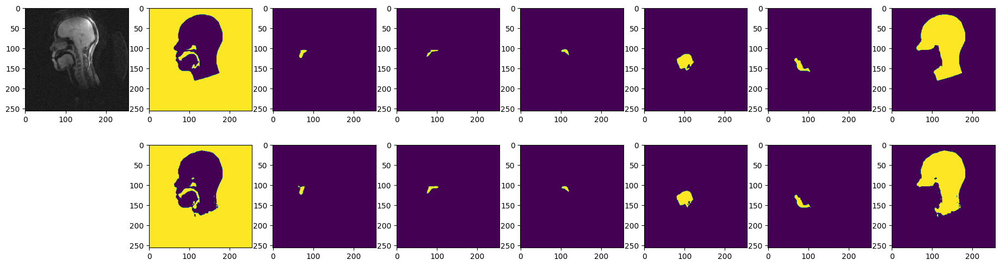

Img n°:  7


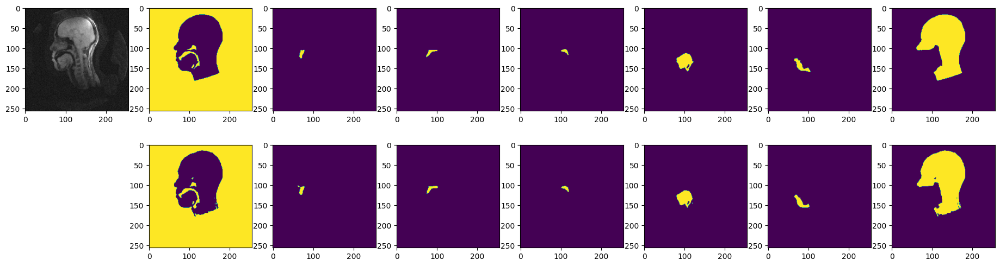

Img n°:  8


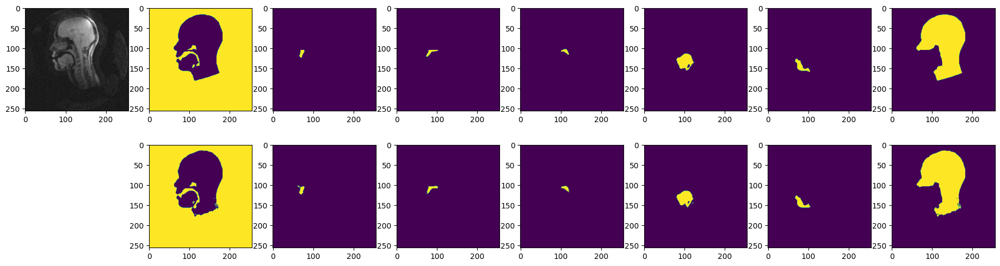

Img n°:  9


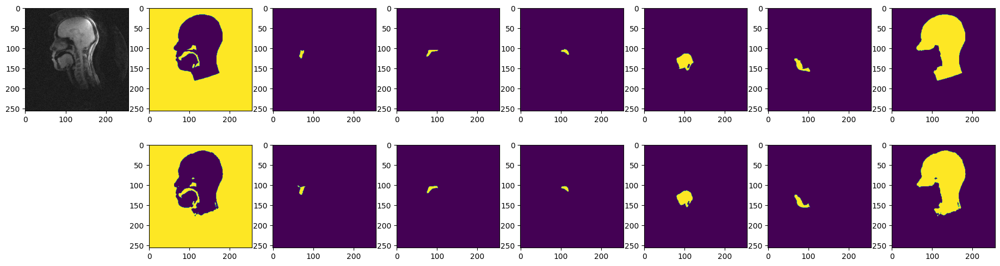

Img n°:  10


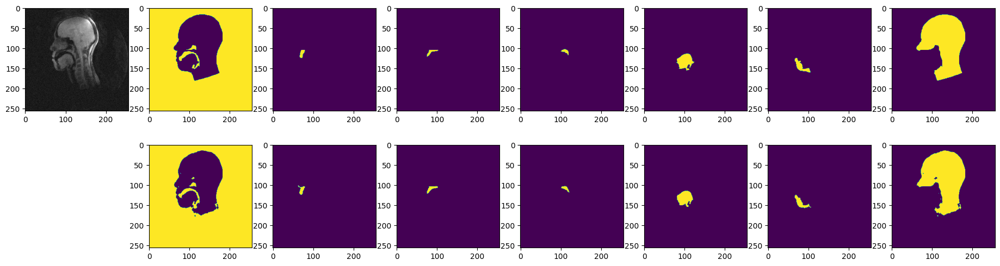

Img n°:  11


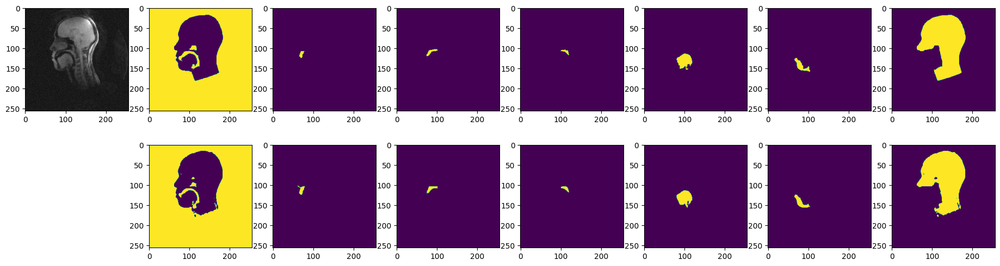

Img n°:  12


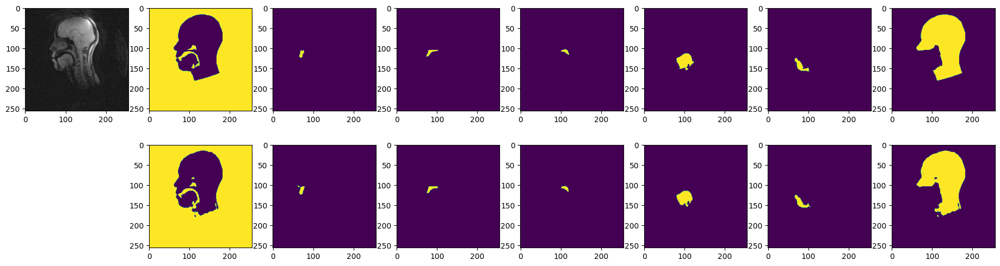

Img n°:  13


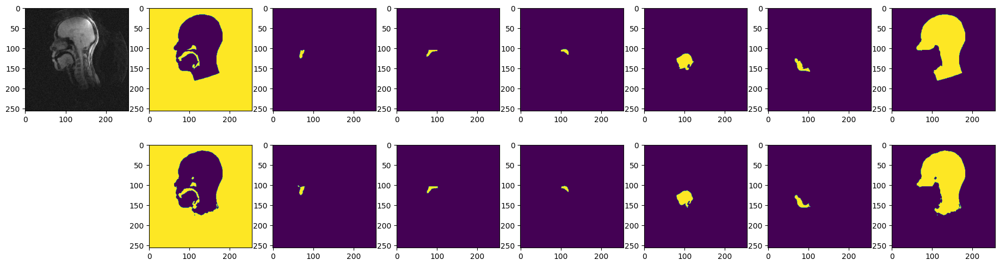

Img n°:  14


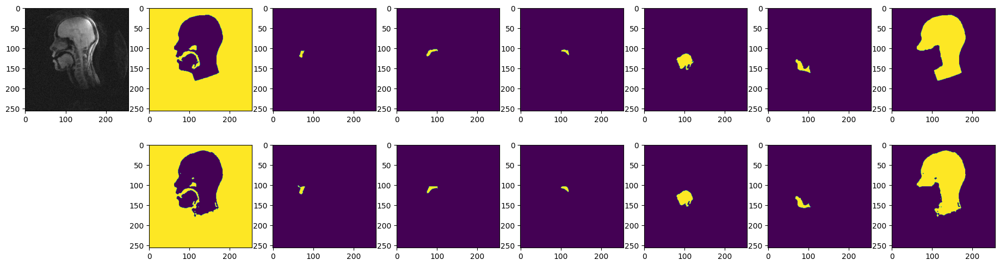

Img n°:  15


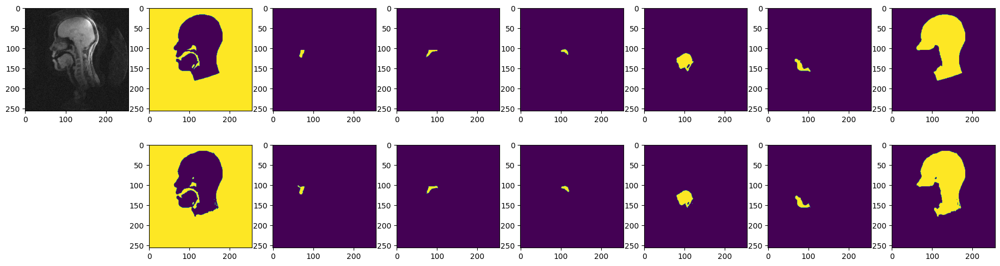

Img n°:  16


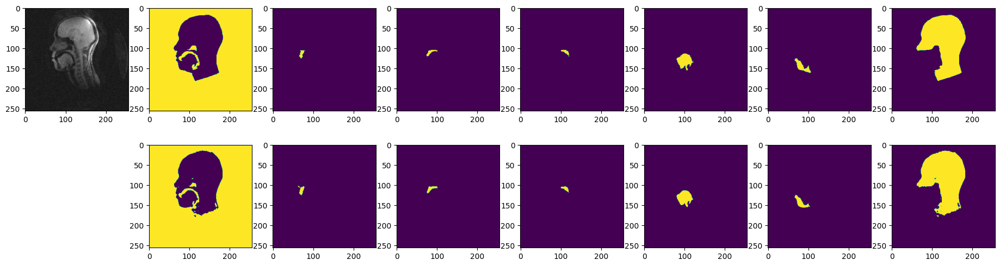

Img n°:  17


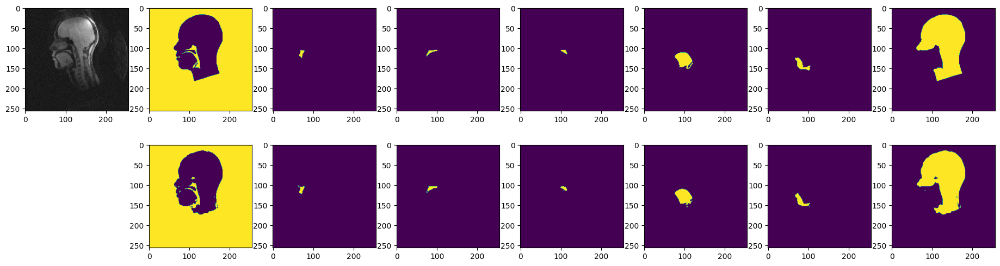

Img n°:  18


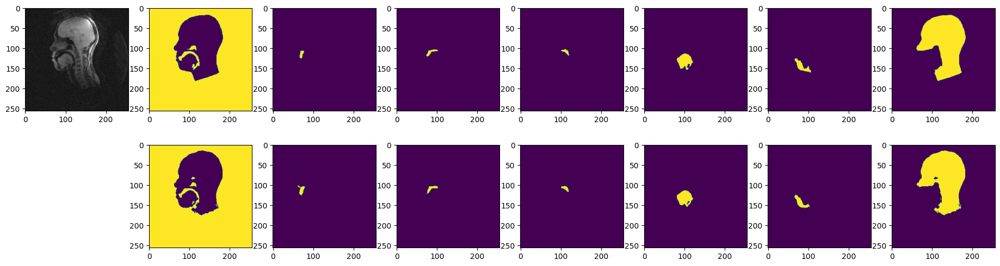

Img n°:  19


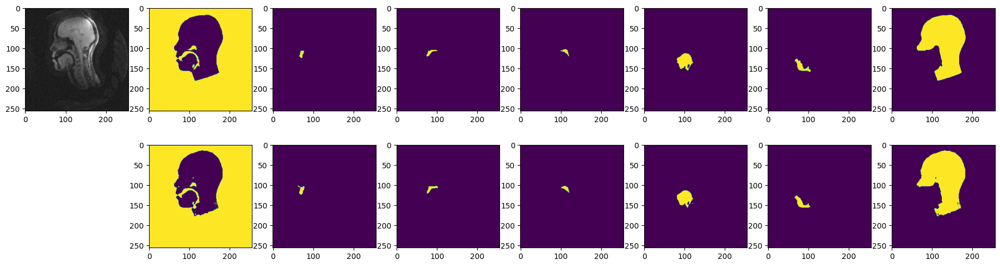

Img n°:  20


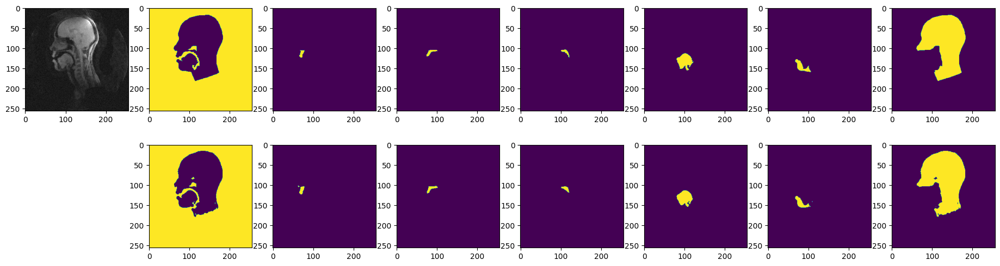

Img n°:  21


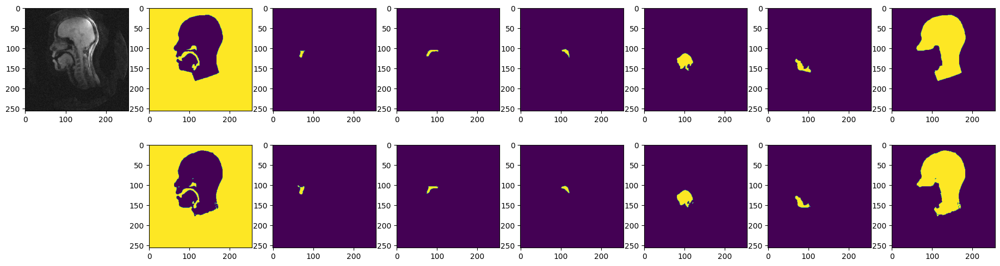

Img n°:  22


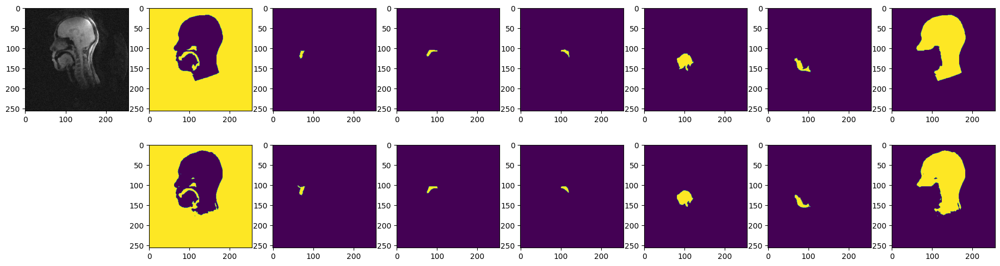

Img n°:  23


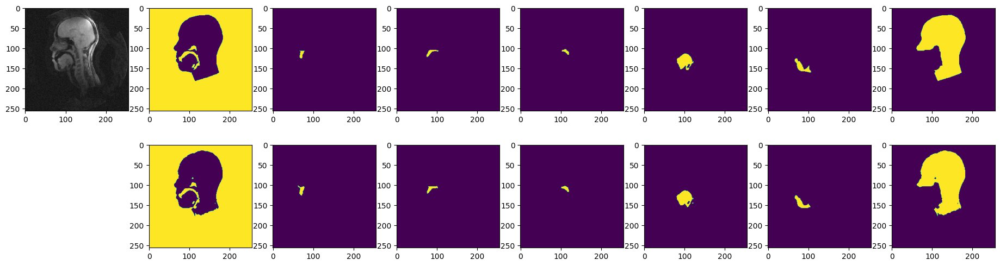

Img n°:  24


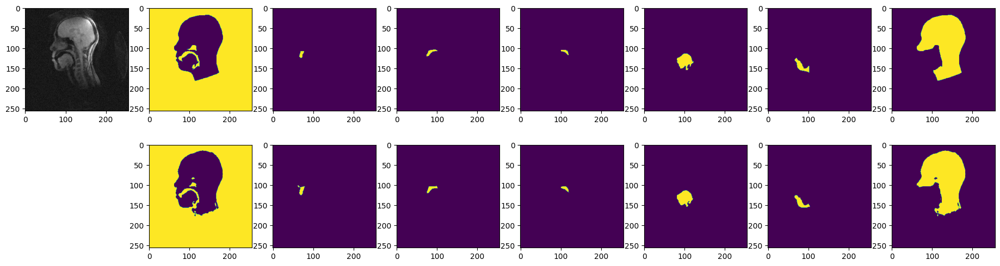

Img n°:  25


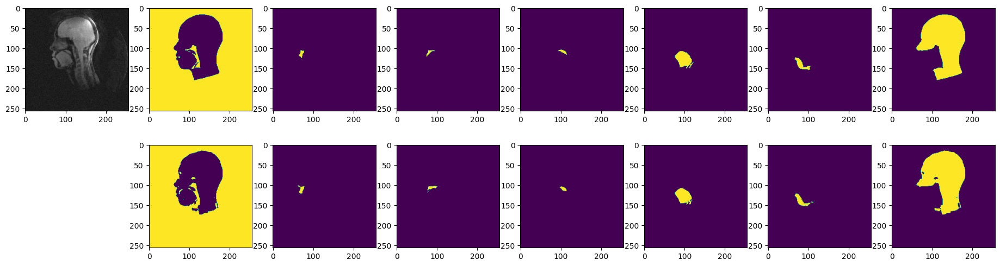

Img n°:  26


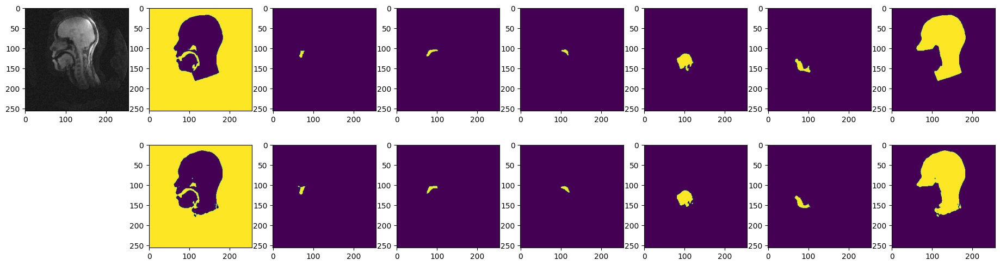

Img n°:  27


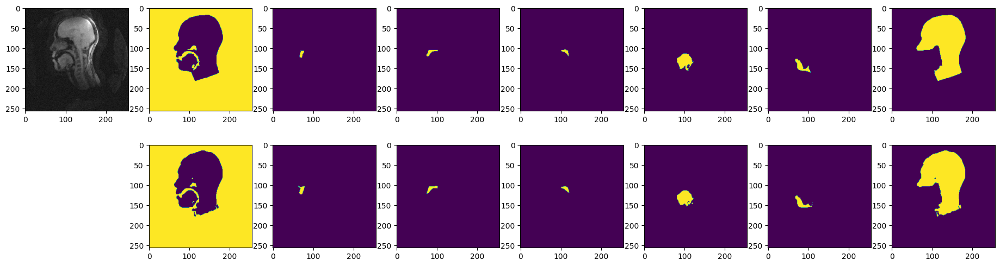

Img n°:  28


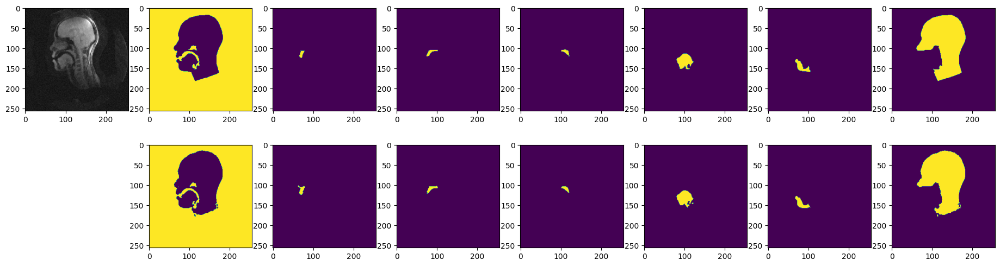

Img n°:  29


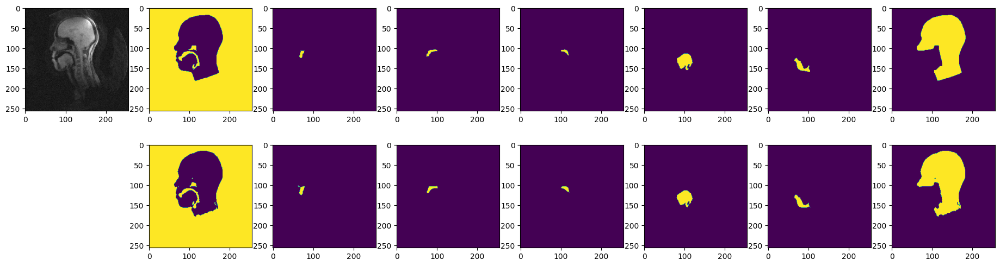

Img n°:  30


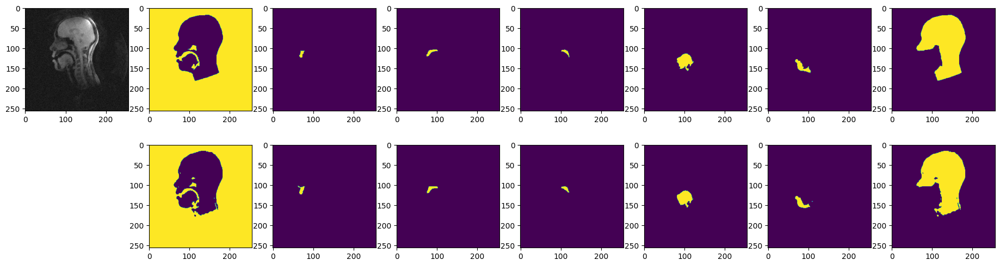

Img n°:  31


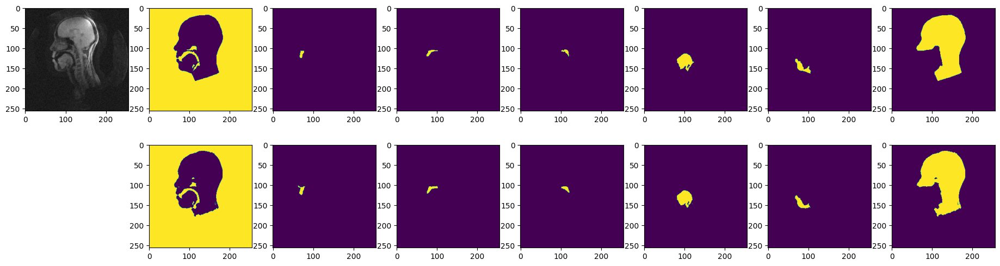

Img n°:  32


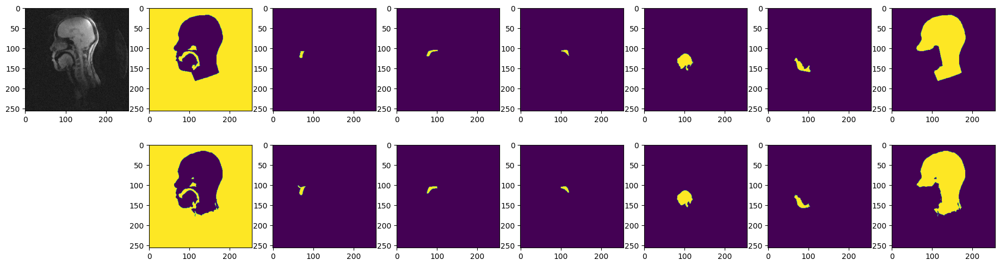

Img n°:  33


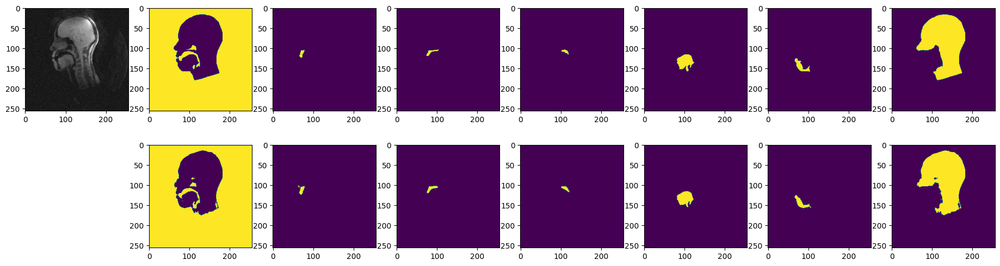

Img n°:  34


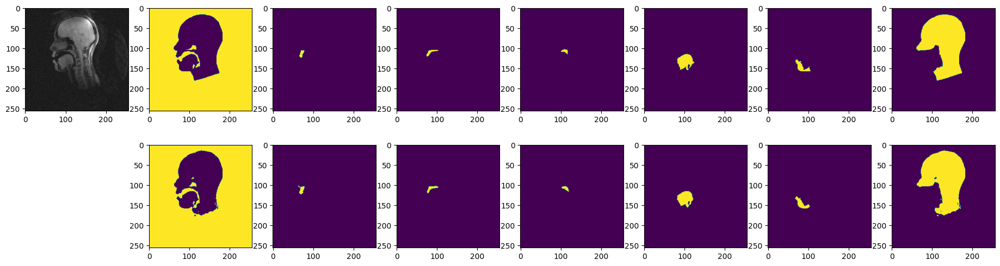

Img n°:  35


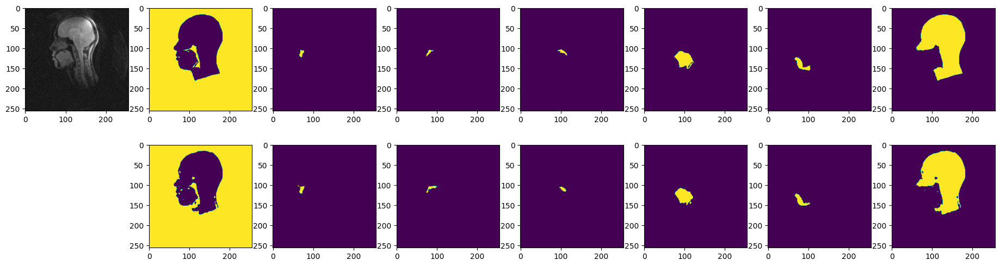

Img n°:  36


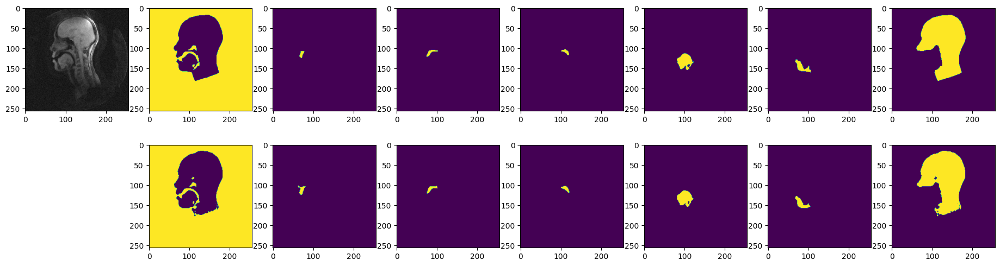

Img n°:  37


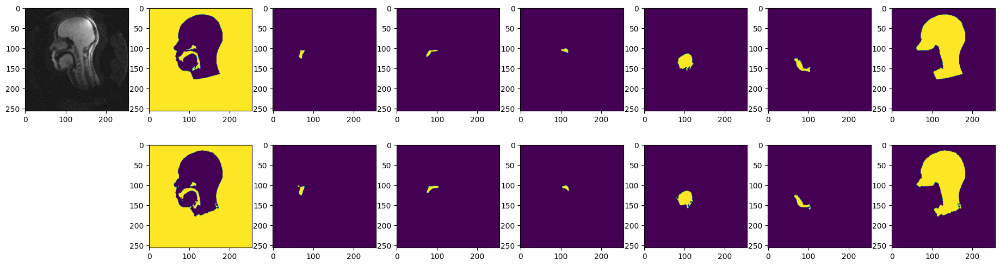

Img n°:  38


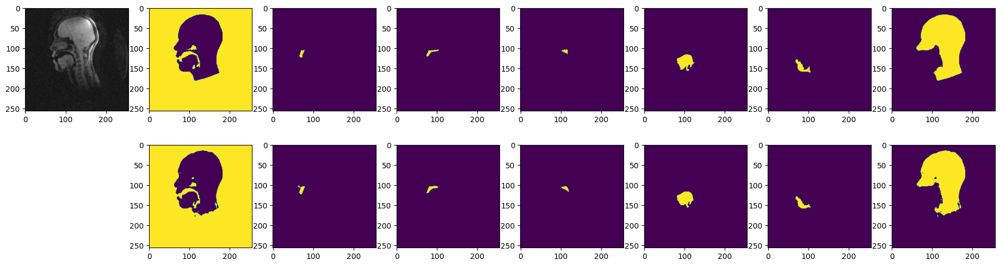

Img n°:  39


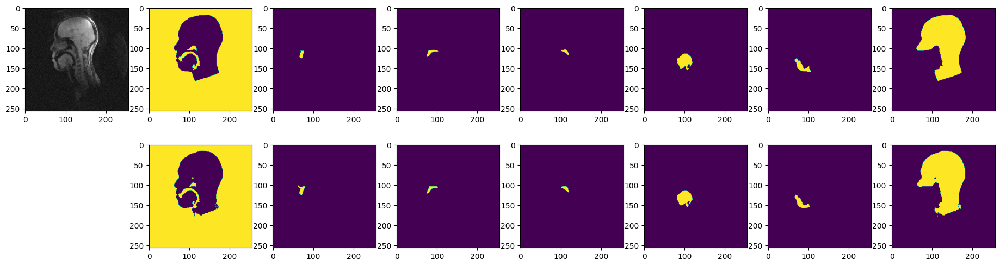

Img n°:  40


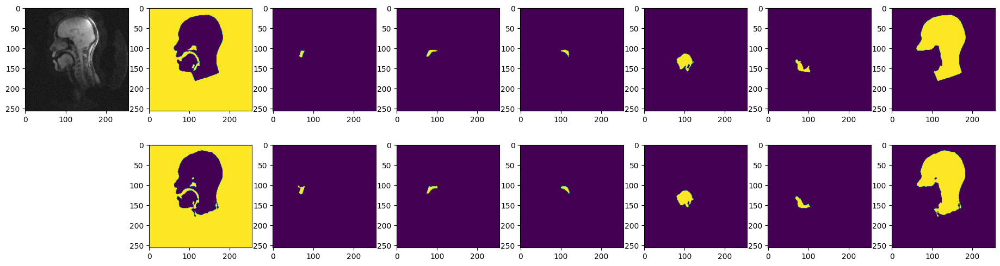

Img n°:  41


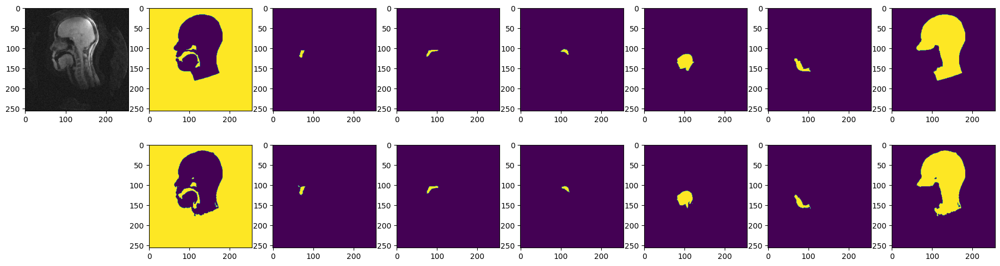

Img n°:  42


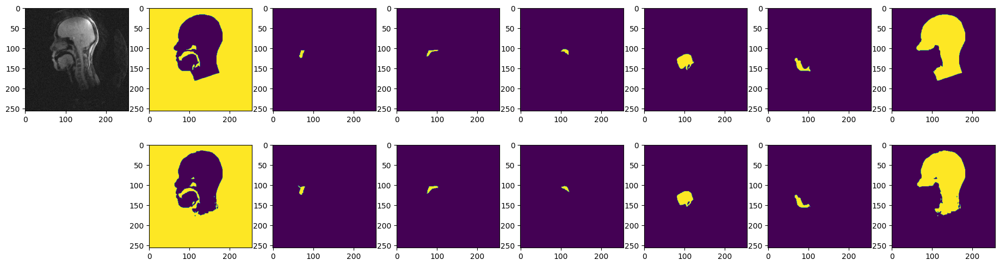

Img n°:  43


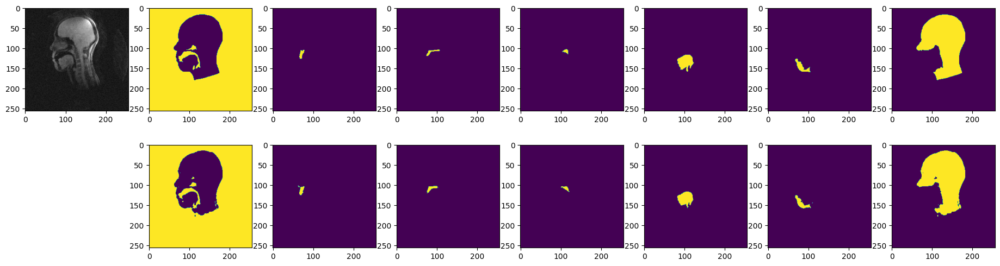

Img n°:  44


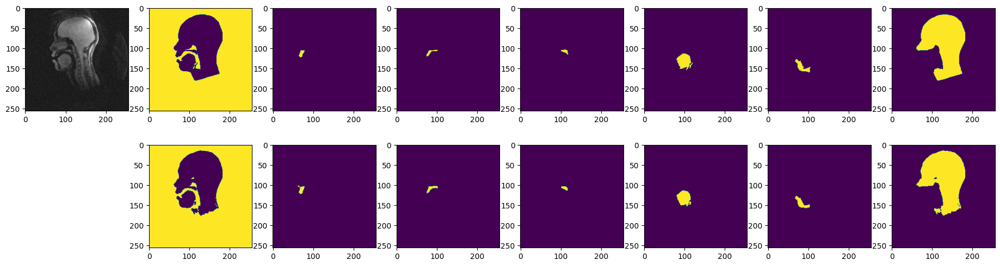

Img n°:  45


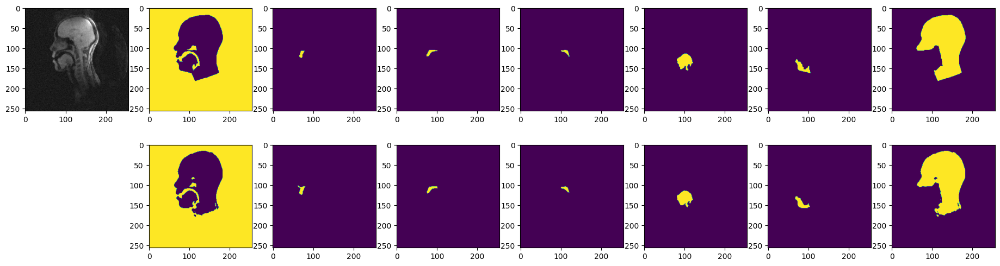

Img n°:  46


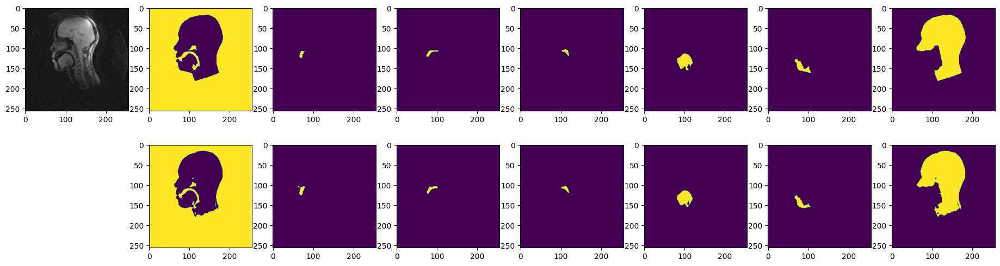

Img n°:  47


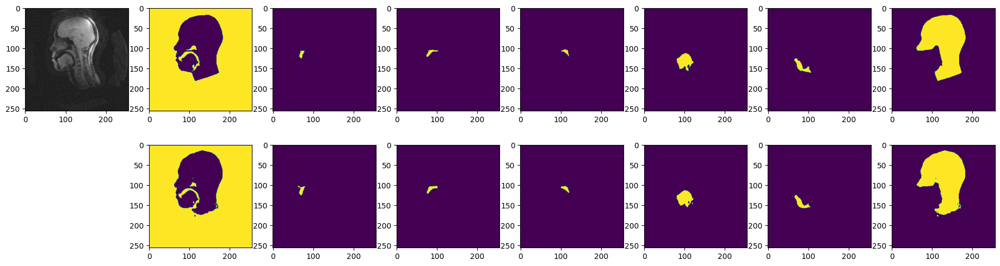

Img n°:  48


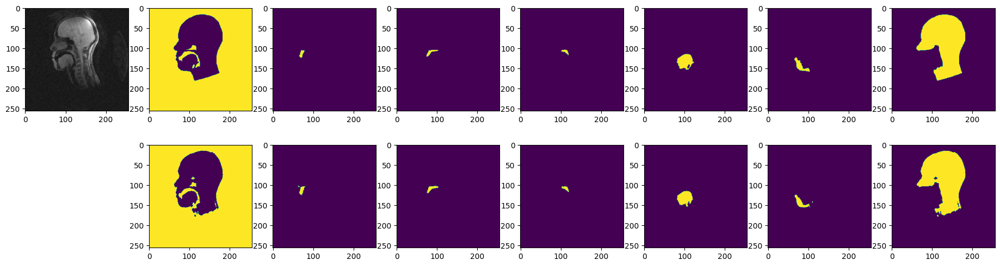

Img n°:  49


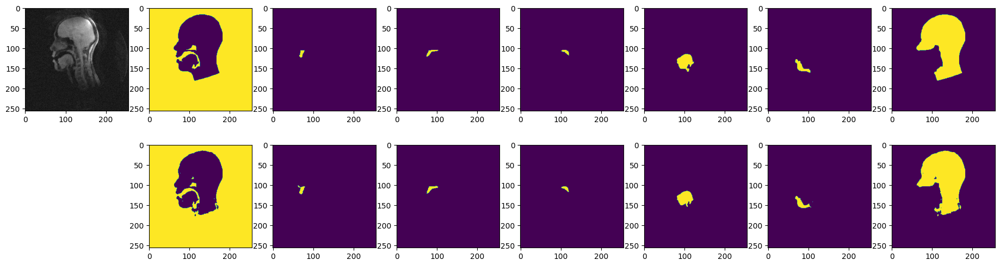

In [ ]:
n = 0
for volume, label in zip(x_test, y_test):

    print("Img n°: ", n)

    fig = plt.figure(figsize = [23, 6])     # generate the white figure (background)
    plt.subplot(2, (NUM_CLASSES + 1), 1)    # Define the grid size (r, c, index) (index must be >= 1)
    plt.imshow(volume[:,:,0], cmap="gray")  # dsMRI image plotting

    for i in range(NUM_CLASSES): # Iteration over classes for each image

        plt.subplot(2, (NUM_CLASSES + 1), i+2)  # Index moving to identify the correct grid coordinate
        plt.imshow(label[:,:,i])                # Ground Truth plotting

        plt.subplot(2, (NUM_CLASSES + 1), i+10) # Index moving to identify the correct grid coordinate
        plt.imshow(predictions_onehot[n,:,:,i]) # Predictions plotting

    n = n + 1
    plt.show(fig) # Subplot figure plotting
n = 0

## 11.4 Metrics

Here, a more formal and scientific approach is carried out for evaluating the model. We used the Monai library to effectively implement the metrics' calculation.

In [ ]:
import torch

# Convert predictions and labels to tensors
predictions_tensor = torch.from_numpy(predictions_onehot)  # (n, 256, 256, 7)
labels_tensor = torch.from_numpy(y_test)                   # (n, 256, 256, 7)

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
predictions_tensor = predictions_tensor.to(device)
labels_tensor = labels_tensor.to(device)

In [ ]:
# Convert from one-hot encoding to class indices
predictions_classes = torch.argmax(predictions_tensor, dim=-1)  # (n, 256, 256)
labels_classes = torch.argmax(labels_tensor, dim=-1)            # (n, 256, 256)

In [ ]:
!pip install monai

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 25.0 MB/s eta 0:00:00


In [ ]:
y_pred = predictions_tensor.permute(0, 3, 1, 2)  # (n, 7, 256, 256)
y_true = labels_tensor.permute(0, 3, 1, 2)

In [ ]:
from monai.metrics import DiceMetric

# Initialize the Dice metric
dice_metric = DiceMetric(include_background=True, reduction="mean", get_not_nans=False)

# Calculate the Dice score
dice_score = dice_metric(y_pred, y_true)            # Convert from (n, 256, 256, 7) to (n, 7, 256, 256))
print(f"Dice Score: {dice_score.mean(dim=0)}")

Dice Score: tensor([0.9921, 0.8379, 0.8318, 0.8703, 0.9572, 0.9026, 0.9693],
       device='cuda:0', dtype=torch.float64)


In [ ]:
# Convert the Dice score to IoU (Intersection over Union)
iou_score = dice_score / (2 - dice_score)
print(f"IoU Score: {iou_score.mean(dim=0)}")

IoU Score: tensor([0.9843, 0.7225, 0.7166, 0.7727, 0.9179, 0.8233, 0.9404],
       device='cuda:0', dtype=torch.float64)


In [ ]:
from monai.metrics import HausdorffDistanceMetric

# Initialize the Hausdorff distance metric
hausdorff_metric = HausdorffDistanceMetric(include_background=True, percentile=95.0)

# Calculate the Hausdorff distance
hausdorff_score = hausdorff_metric(y_pred, y_true)

print(f"Hausdorff Distance: {hausdorff_score.mean(dim=0)}")


Hausdorff Distance: tensor([3.5520, 6.2257, 2.1359, 1.7437, 2.2048, 3.3312, 6.4152],
       device='cuda:0')


In [ ]:
from monai.metrics import get_confusion_matrix, compute_confusion_matrix_metric

conf_matrix = get_confusion_matrix(predictions_tensor.permute(0, 3, 1, 2), labels_tensor.permute(0, 3, 1, 2), include_background = True)
precision = compute_confusion_matrix_metric("precision", conf_matrix)
recall = compute_confusion_matrix_metric("recall", conf_matrix)
accuracy = compute_confusion_matrix_metric("accuracy", conf_matrix)
print(f"Precision: {precision.mean(dim=0)}")
print(f"Recall: {recall.mean(dim=0)}")
print(f"Accuracy: {accuracy.mean(dim=0)}")